# SVM и его ядра
__Суммарное количество баллов: 9__

__Мягкий дедлайн: `25.11.2021` | Жесткий дедлайн: `02.12.2021`__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][HW07] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [158]:
import numpy as np
import copy
from cvxopt import spmatrix, matrix, solvers
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification, make_moons, make_blobs
from typing import NoReturn, Callable

solvers.options['show_progress'] = False

In [159]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = np.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors='black')
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], cmap=cm, alpha=1., marker='*',
               s=50, edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], cmap=cm, alpha=1., edgecolor='yellow', linewidths=1.,
               s=40)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [160]:
def generate_dataset(moons=False):
    if moons:
        X, y = make_moons(1000, noise=0.075, random_state=42)
        return X, 2 * y - 1
    X, y = make_blobs(1000, 2, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=42)
    y = 2 * (y % 2) - 1
    return X, y

X, y = generate_dataset(True)

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM. 

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P = 
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\ 
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C 
    \end{array}
\right] \\ 
 G = 
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1 
    \end{array}
\right] $

In [161]:
class LinearSVM:
    def __init__(self, C: float):
        self.C = C
        self.support = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:

      samples, features = X.shape
    
      y = y.reshape(-1, 1)
      
      solution = np.array(solvers.qp(
          matrix(np.block([
            [np.eye(samples), np.zeros((samples, 3))],
            [np.zeros((3, samples)), np.zeros((3, 3))]
          ])),
          matrix(np.block([
            np.zeros(3),
            np.ones(samples) * self.C
          ])),
          matrix(np.block([
            [np.zeros((samples, features)), np.zeros((samples, 1)), -np.eye(samples)],
            [-y * X, -y, -np.eye(samples)]
          ])),
          matrix(np.block([
            [np.zeros((samples, 1))],
            [-np.ones((samples, 1))]
          ]))
      )['x']).reshape(samples + 3)


      self.weights = solution[:features]
      self.bias = solution[features]

      self.support = [i for i in range(len(solution[features + 1:])) 
      if solution[features + 1:][i] > 1e-4]

    def decision_function(self, X: np.ndarray) -> np.ndarray:
      return np.dot(X, self.weights) + self.bias

    def predict(self, X: np.ndarray) -> np.ndarray:
      return np.sign(self.decision_function(X))

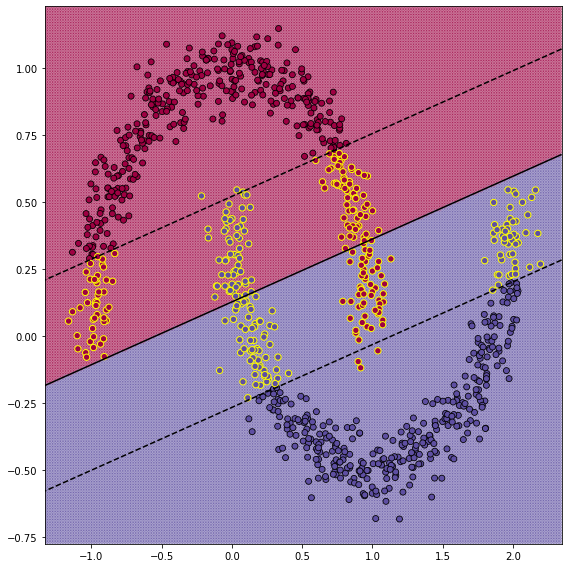

In [162]:
X, y = generate_dataset(True)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

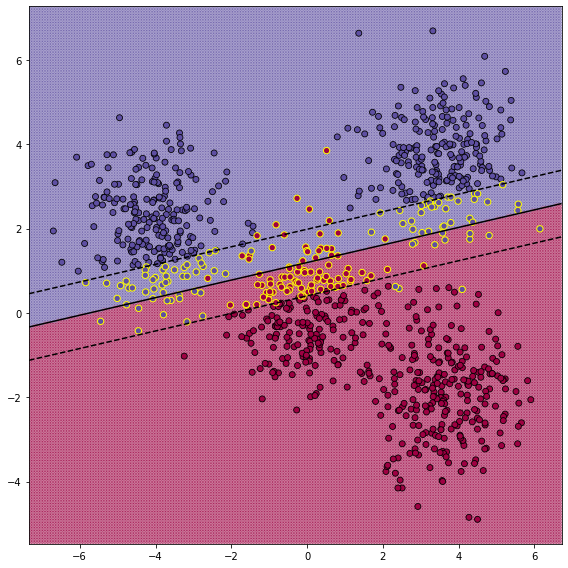

In [163]:
X, y = generate_dataset(False)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 2 (2 балла)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [164]:
def get_polynomial_kernel(c=1, power=2):
    "Возвращает полиномиальное ядро с заданной константой и степенью"
    return lambda a, b: (c + a @ b.T) ** power

def get_gaussian_kernel(sigma=1.):
    "Возвращает ядро Гаусса с заданным коэффицинтом сигма"
    return lambda a, b: np.exp(-sigma * np.linalg.norm(b - a) ** 2)

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Конструктор
`kernel` - ядро-функция

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P = 
\left[ y_i y_j K(y_i, y_j) \right] \\ 
q = \left[ -1
\right] \\ 
 G = 
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0 
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [165]:
class KernelSVM:
    def __init__(self, C: float, kernel: Callable):
        self.C = C
        self.kernel = kernel
        self.support = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        samples, _ = X.shape

        K = np.zeros((samples, samples))
        for i in range(samples):
          for j in range(samples):
            K[i,j] = self.kernel(X[i], X[j])

        self.alpha = np.ravel(solvers.qp(
            matrix(np.outer(y, y) * K),
            matrix(-np.ones((samples, 1))),
            matrix(np.block([
                [np.eye(samples)],
                [-np.eye(samples)]
            ])),
            matrix(np.block([
                np.ones(samples) * self.C,
                np.zeros(samples)                 
            ])),
            matrix(y.astype('float'), (1, samples)),
            matrix(0.0)
        )['x'])

        self.support = np.arange(samples)[self.alpha > 1e-4]
        self.support_X = X[self.support]
        self.support_y = y[self.support]
        self.alpha = self.alpha[self.support]

        self.bias = np.mean(self.support_y - np.sum(self.alpha * self.support_y *  K[:, self.support][self.support, :], axis=1))


    def decision_function(self, X: np.ndarray) -> np.ndarray:
        def helper(x):
            s = 0
            for alpha, support_y, support_X in zip(self.alpha, self.support_y, self.support_X):
                s += alpha * support_y * self.kernel(x, support_X)
            return s
        return np.apply_along_axis(helper, 1, X) + self.bias

    def predict(self, X: np.ndarray) -> np.ndarray:
        return np.sign(self.decision_function(X))

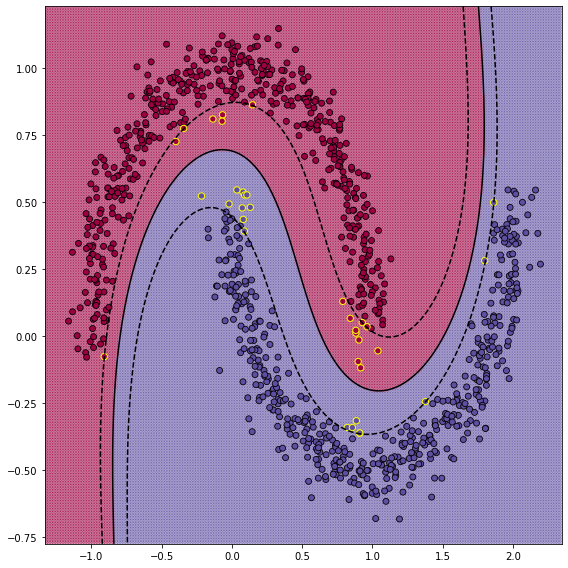

In [166]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

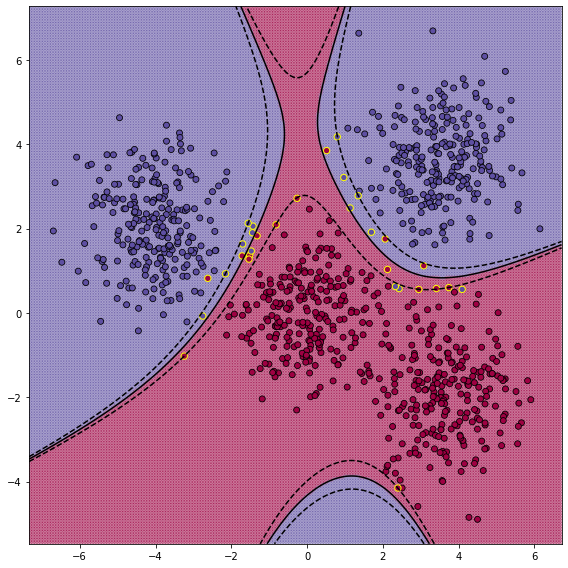

In [167]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

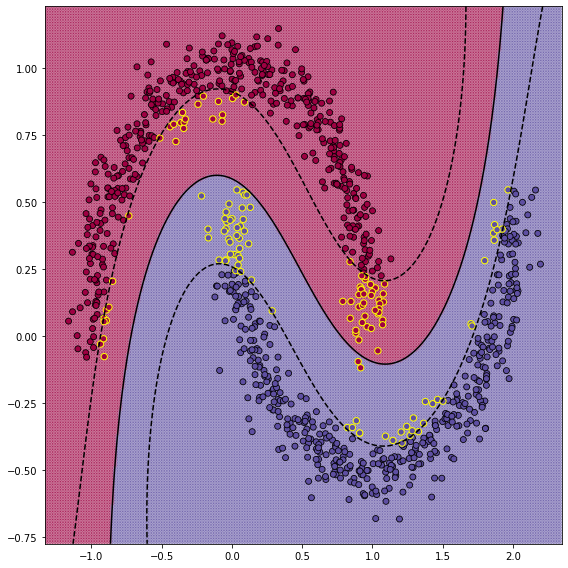

In [168]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

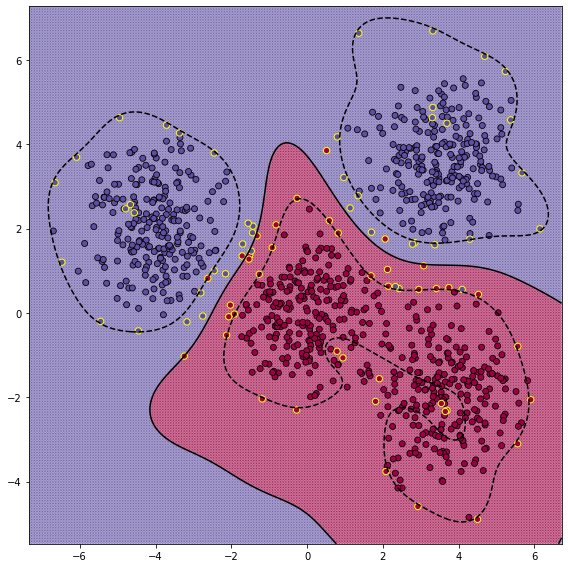

In [169]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 4 (3 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

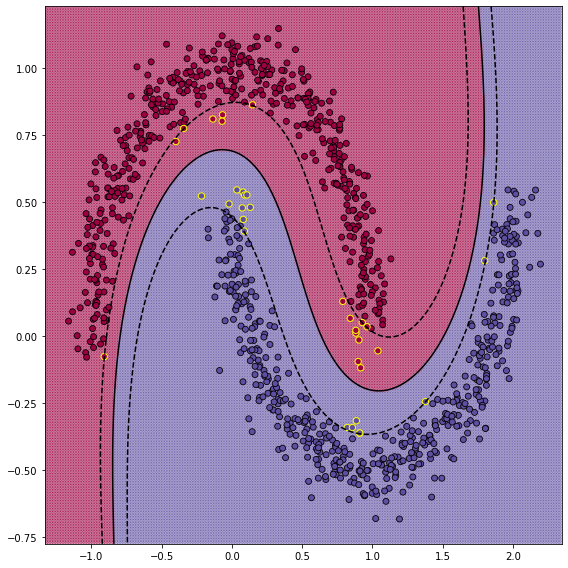

In [172]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

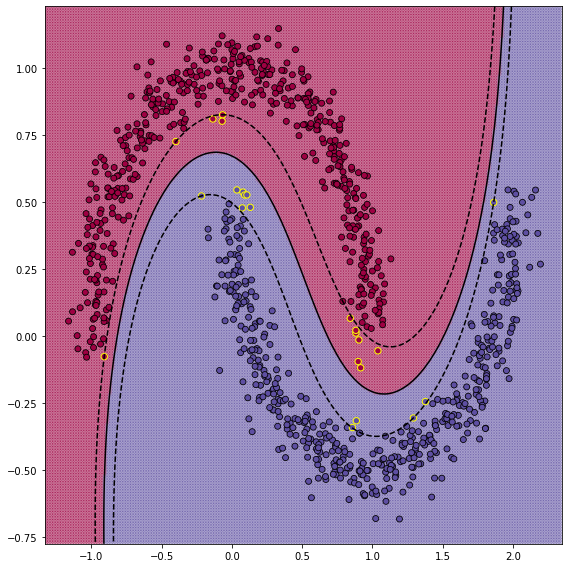

In [176]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(10000, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

Увеличении константы в полиномиальном ядре -> ширина разделяющей полосы уменьшается

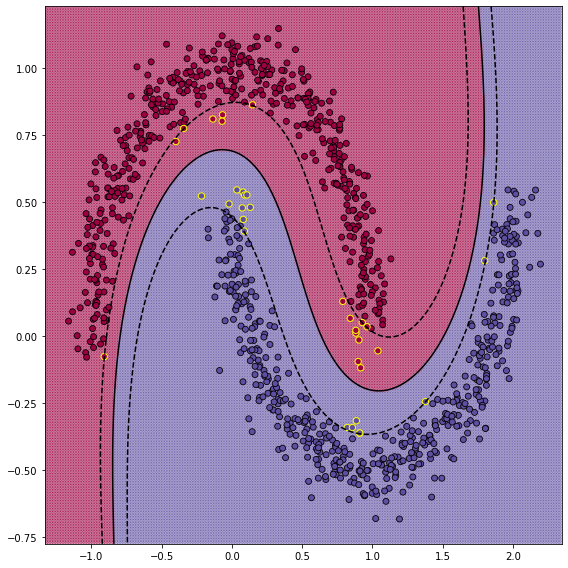

In [182]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

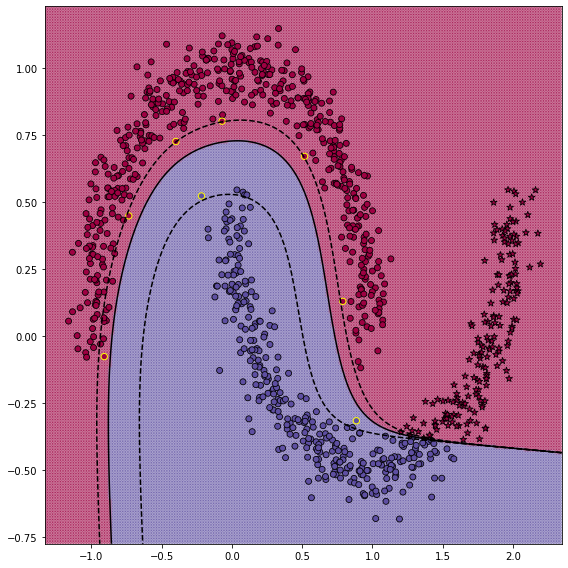

In [185]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 15))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

Увеличение степени -> модель начинает плохо предсказывать и сильно переобучается

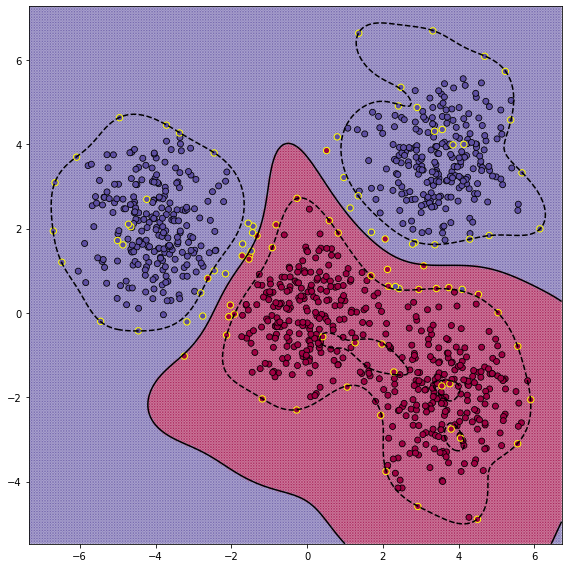

In [187]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.5))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

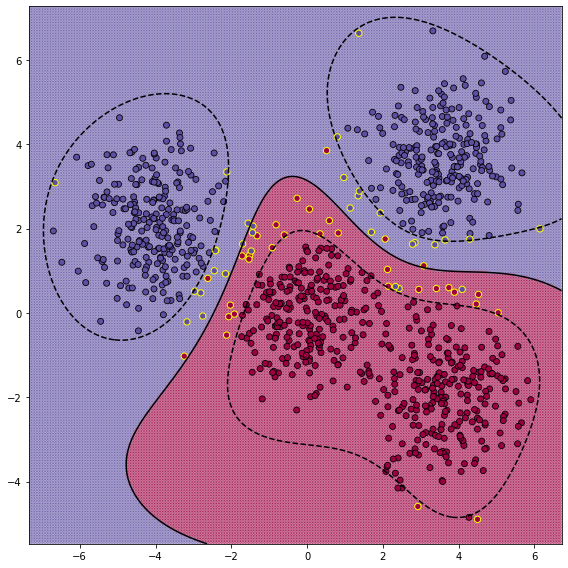

In [188]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.1))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

Уменьшение сигмы -> контуры становятся более простыми(улучшается генерализуемость)

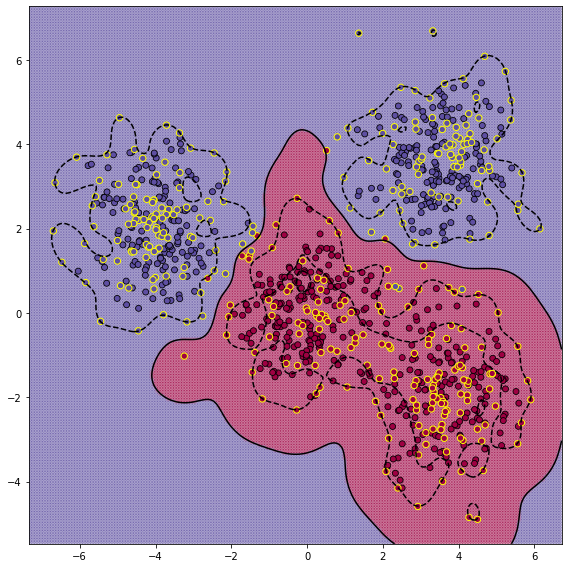

In [189]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(2))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

Увеличение сигмы -> модель начинает плохо предсказывать, переобучается, контур становится более сложной формы 